In [153]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

## Recto Fondo Blanco

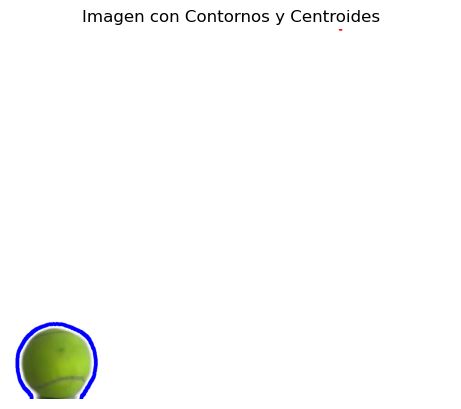

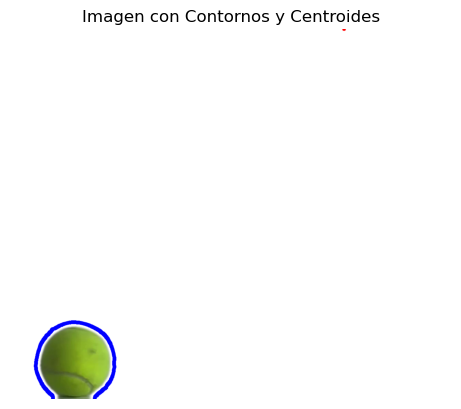

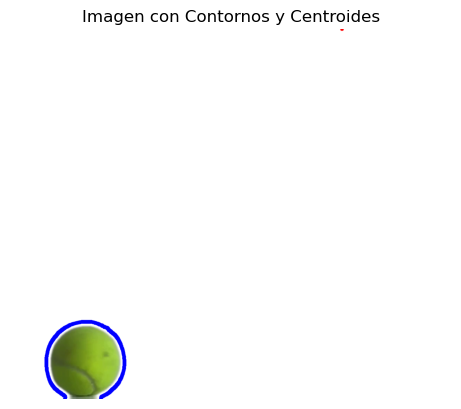

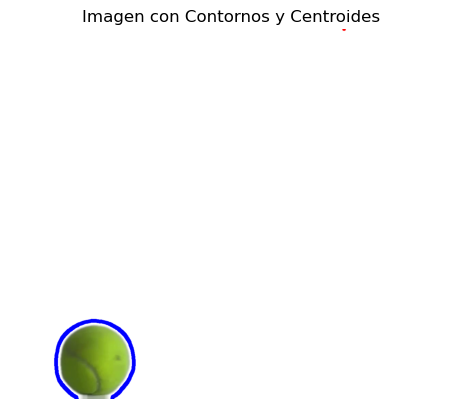

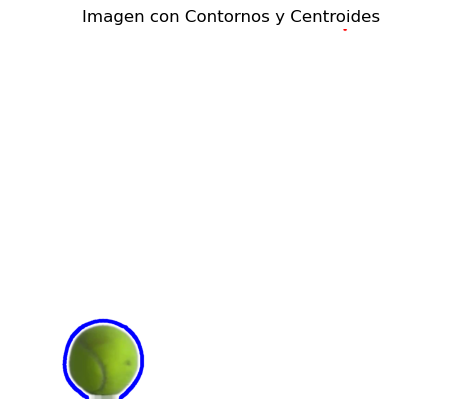

...

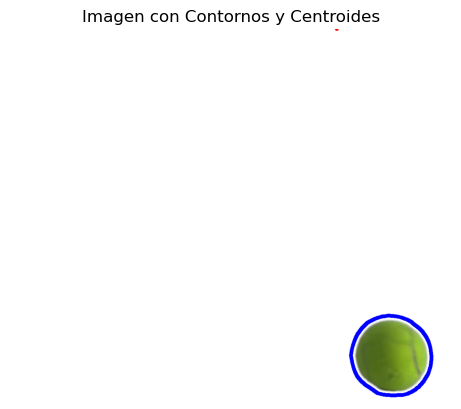

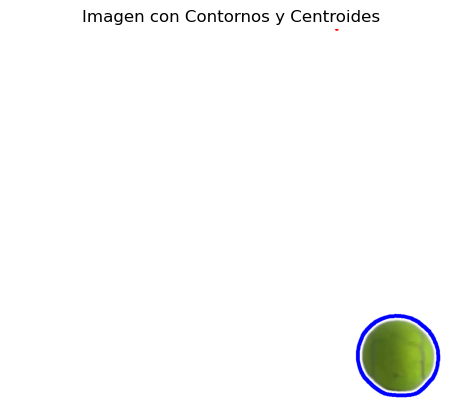

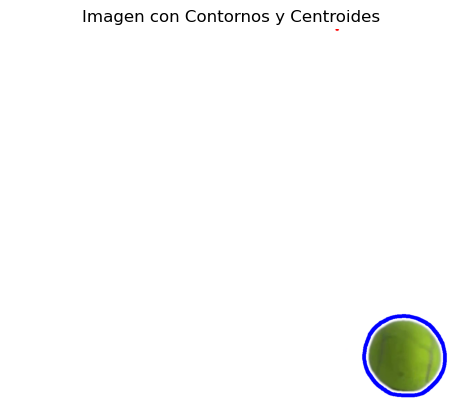

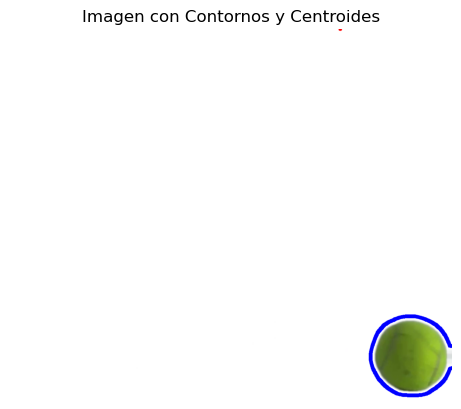

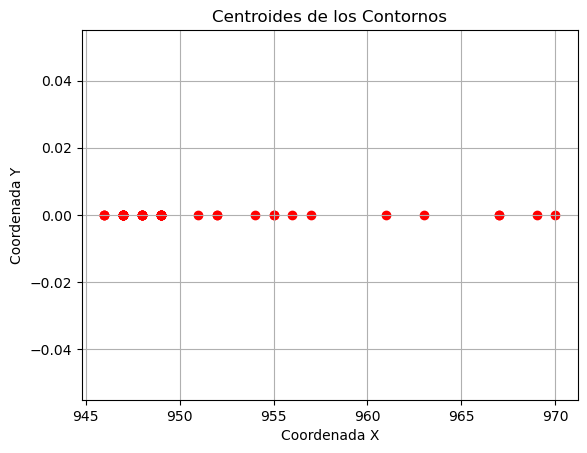

In [154]:
recto_fondoblanco = cv2.VideoCapture('./videos/nuevo_recto_fondoblanco.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
while True:
    ret, frame = recto_fondoblanco.read()
    
    if not ret:
        break
    
    imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(imagen_gris, (9, 9), 0)
    
    umbral = 250  # Puedes cambiar este valor según tus necesidades

    # Binarizar la imagen
    _, img_binarizada = cv2.threshold(imagen_gris, umbral, 255, cv2.THRESH_BINARY)

    # Tamaño del kernel (asegúrate de que sea un número impar para que tenga un centro)
    tamaño_kernel = 19

    # Crear una matriz de ceros del tamaño especificado
    kernel_circulo = np.zeros((tamaño_kernel, tamaño_kernel), dtype=np.uint8)

    # Calcular el centro del kernel
    centro_x, centro_y = tamaño_kernel // 2, tamaño_kernel // 2

    # Calcular el radio del círculo
    radio = tamaño_kernel // 2

    # Llenar la matriz con un círculo de unos
    for i in range(tamaño_kernel):
        for j in range(tamaño_kernel):
            if (i - centro_x) ** 2 + (j - centro_y) ** 2 <= radio ** 2:
                kernel_circulo[i, j] = 1

    # Aplicar dilatación a la imagen binaria
    imagen_dilatada = cv2.erode(img_binarizada, kernel_circulo, iterations=1)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(imagen_dilatada, 70, 150)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m01"] / momentos["m00"])
            centroide_y = int(momentos["m00"] / momentos["m01"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (0, 0, 255), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()
    
    plt.pause(0.03)  
    cont += 1
    if cont >= 49:
        break

# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

"""
hist = cv2.calcHist([frame_gris], [0], None, [256], [0, 256])

# Visualizar la imagen y su histograma
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(frame_gris, cmap='gray')
ax[0].set_title("Imagen en Grises")
ax[0].axis('off')

# Mostrar el histograma
ax[1].plot(hist, color='black')
ax[1].set_title("Histograma")
ax[1].set_xlabel("Intensidad de Pixel")
ax[1].set_ylabel("Cantidad de Píxeles")
ax[1].grid(True)

plt.tight_layout()
plt.show()
"""
#frame_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

recto_fondoblanco.release()

plt.close('all')

## Rebote Fondo Blanco

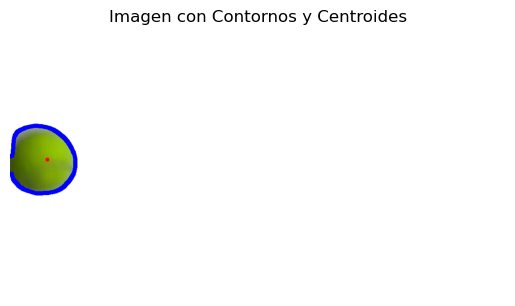

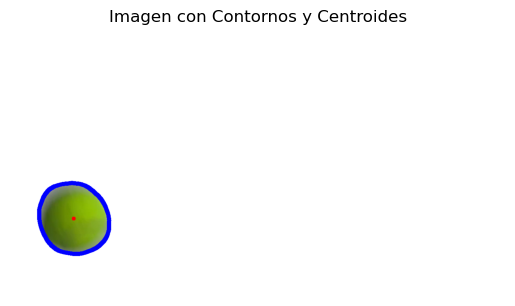

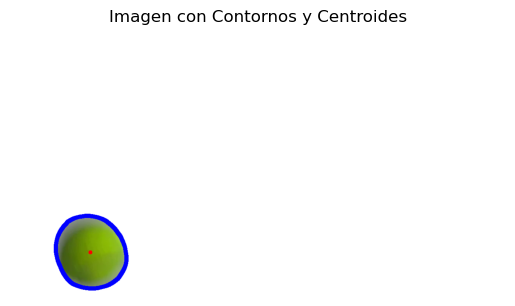

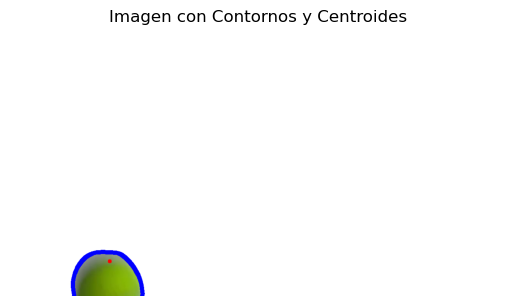

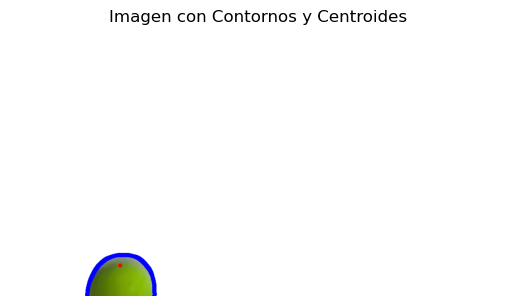

...

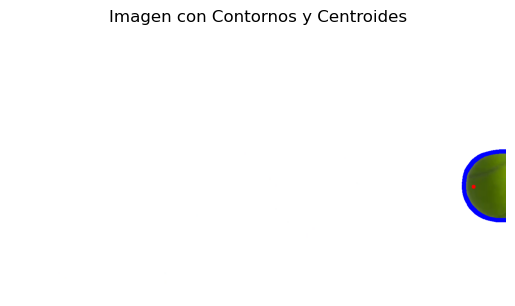

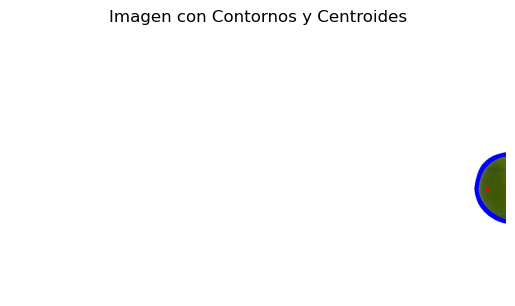

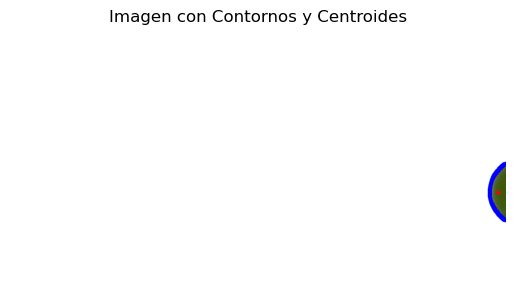

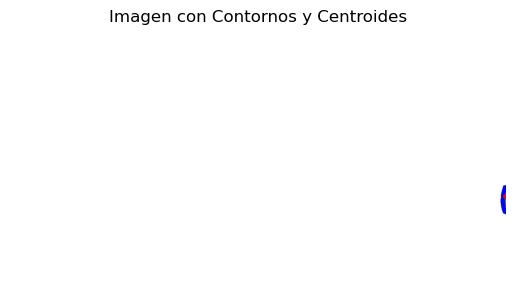

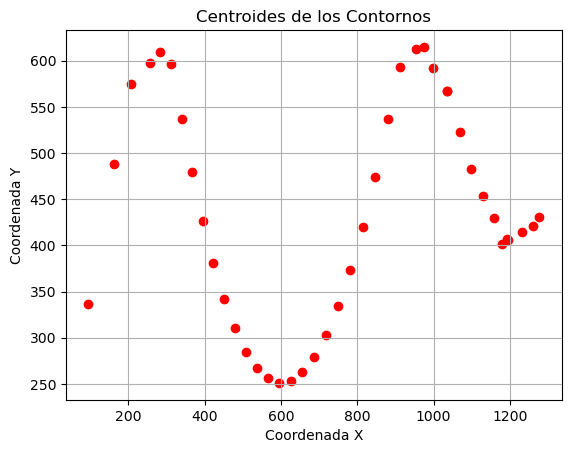

In [155]:
rebote_fondoblanco = cv2.VideoCapture('./videos/nuevo_rebote_fondoblanco.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
while True:
    ret, frame = rebote_fondoblanco.read()
    
    if not ret:
        break
    
    imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(imagen_gris, (9, 9), 0)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(blurred, 70, 150)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m10"] / momentos["m00"])
            centroide_y = int(momentos["m01"] / momentos["m00"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (0, 0, 255), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()
    
    plt.pause(0.03)  
    cont += 1
    if cont >= 41:
        break
    
# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

rebote_fondoblanco.release()

plt.close('all')

## Recto Fondo con Ruido aplicando binarización

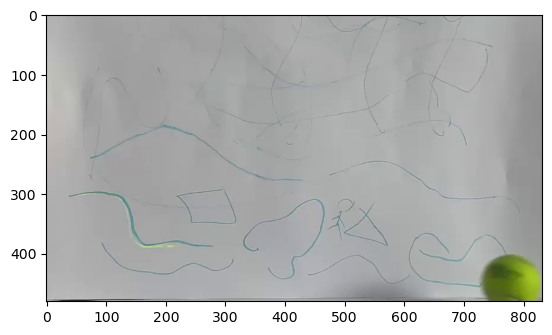

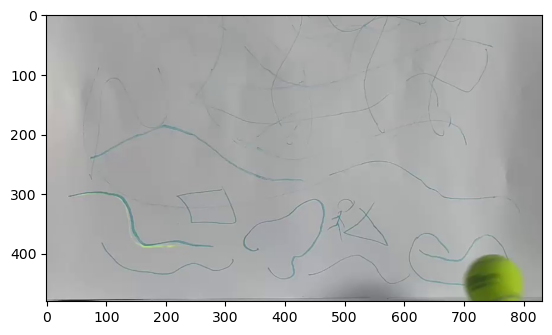

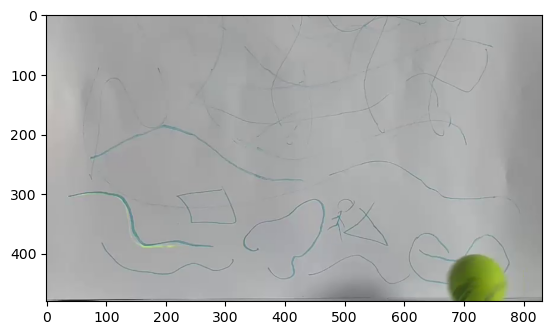

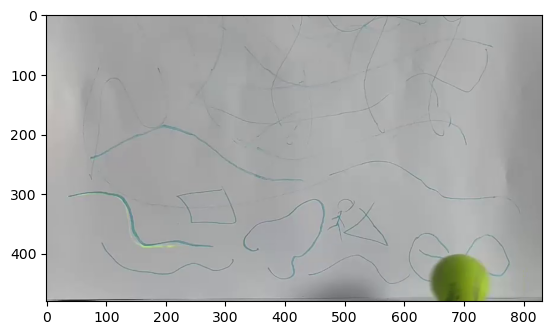

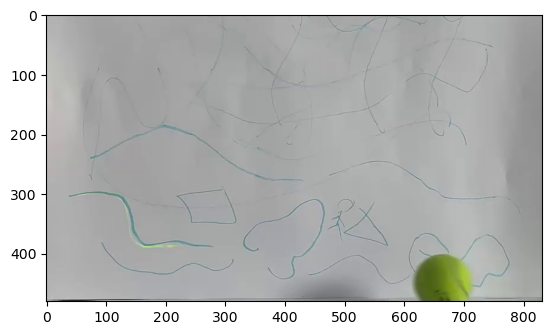

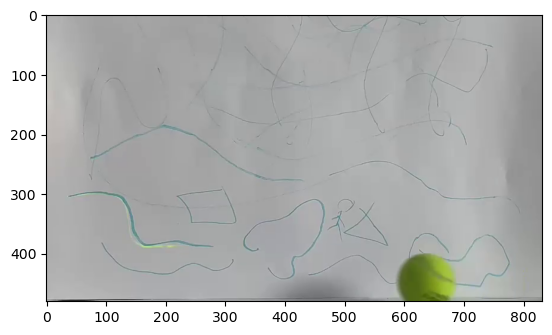

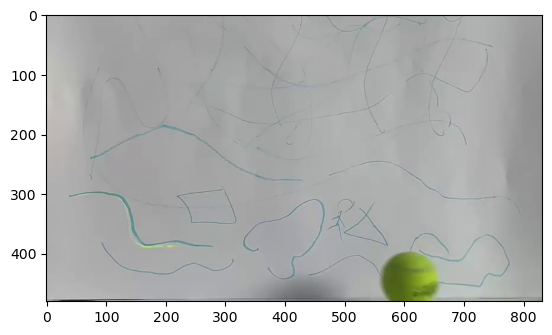

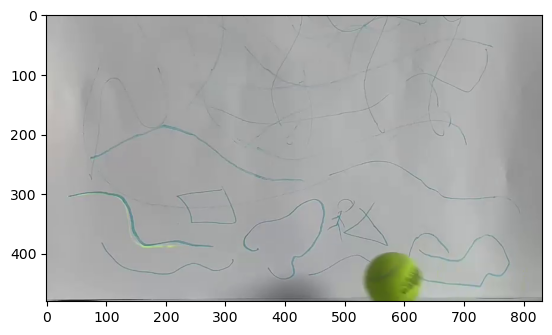

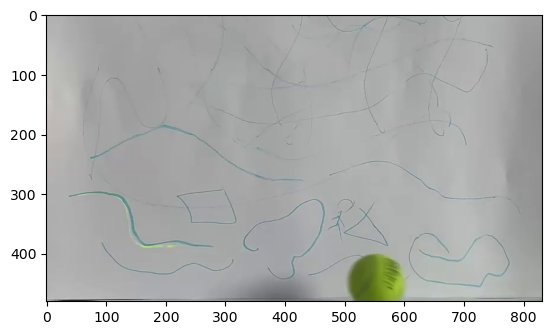

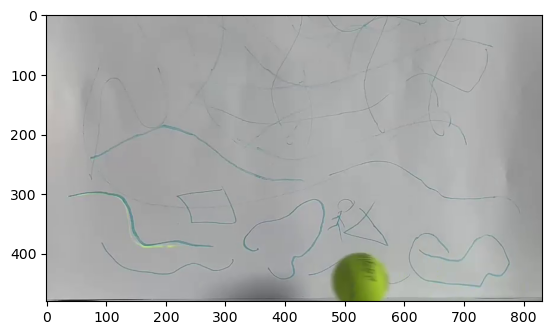

In [156]:
rebote_fondoruido = cv2.VideoCapture('./videos/recto_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

cont = 0
while True:
    ret, frame = rebote_fondoruido.read()
    
    if not ret:
        break
    
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    
    
    plt.imshow(frame)
    plt.pause(0.03)  
    cont += 1
    if cont >= 10:
        break

rebote_fondoruido.release()

plt.close('all')

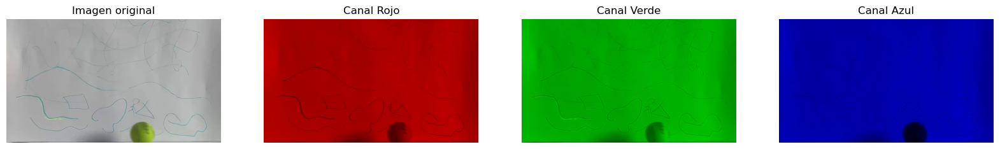

In [157]:

# Leer la imagen y convertirla a RGB

# Crear copias de la imagen para aislar cada canal
imageOutR = frame.copy()
imageOutG = frame.copy()
imageOutB = frame.copy()

# Aislar el canal R
imageOutR[:, :, 1] = 0  # Green
imageOutR[:, :, 2] = 0  # Blue :(dos puntos es todas :(filas), :(columnas), R || G || B (QUITAR CANAL))

# Aislar el canal G
imageOutG[:, :, 0] = 0  # R
imageOutG[:, :, 2] = 0  # B

# Aislar el canal B
imageOutB[:, :, 0] = 0  # R
imageOutB[:, :, 1] = 0  # G

# Visualizar las imágenes
fig, ax = plt.subplots(1, 4, figsize=(20, 5))

#Aplica en la salida el aislamiendo del canal dependiendo la posición del arreglo, es decir con axis se aplican las dimensiones del arreglo
ax[0].imshow(frame)
ax[0].set_title("Imagen original")
ax[0].axis('off')

ax[1].imshow(imageOutR)
ax[1].set_title("Canal Rojo")
ax[1].axis('off')

ax[2].imshow(imageOutG)
ax[2].set_title("Canal Verde")
ax[2].axis('off')

ax[3].imshow(imageOutB)
ax[3].set_title("Canal Azul")
ax[3].axis('off')

plt.show()


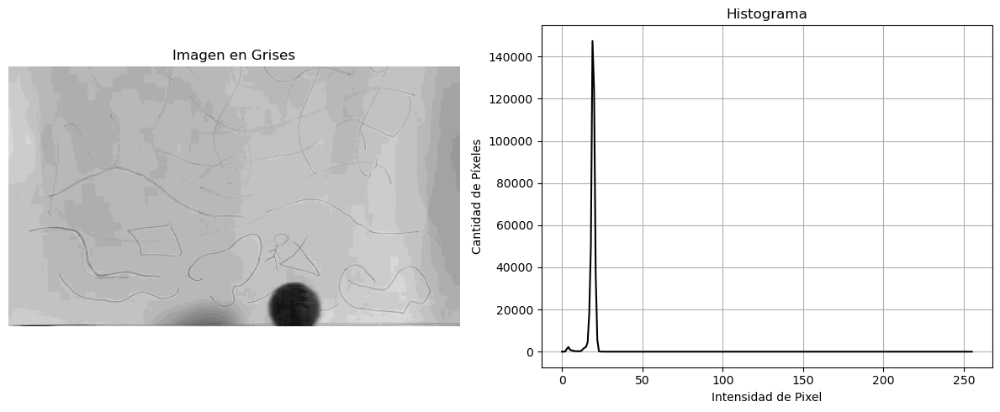

In [158]:

img = cv2.cvtColor(imageOutB, cv2.COLOR_RGB2GRAY)  

# Calcular el histograma
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

# Visualizar la imagen y su histograma
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen en Grises")
ax[0].axis('off')

# Mostrar el histograma
ax[1].plot(hist, color='black')
ax[1].set_title("Histograma")
ax[1].set_xlabel("Intensidad de Pixel")
ax[1].set_ylabel("Cantidad de Píxeles")
ax[1].grid(True)

#Su propósito principal es ajustar automáticamente los márgenes y espacios entre subtramas o elementos en un gráfico.
plt.tight_layout()

plt.show()


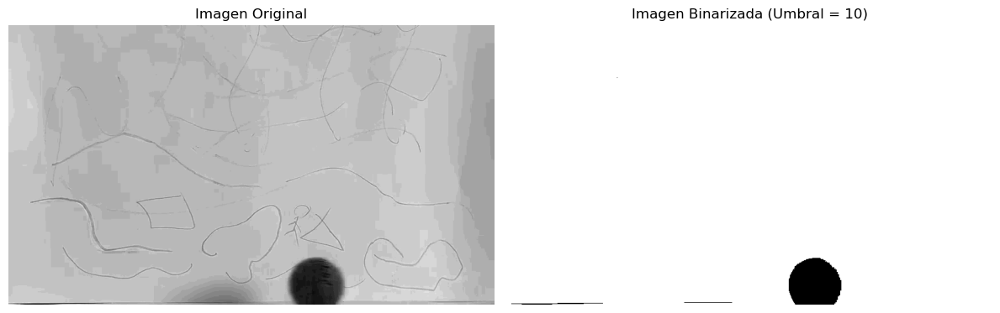

In [159]:

# Puedes cambiar este valor según tus necesidades
umbral = 10 

# Binarizar la imagen
_, img_binarizada = cv2.threshold(img, umbral, 255, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

#Su propósito principal es ajustar automáticamente los márgenes y espacios entre subtramas o elementos en un gráfico.
plt.tight_layout()

plt.show()


Erosion

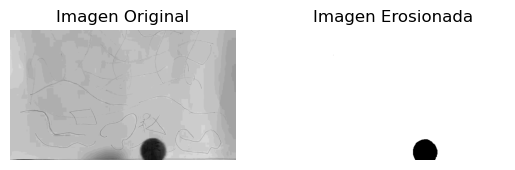

In [160]:
#imagen_para_erosion = img_binarizada
# Crear un kernel (elemento estructurante) para la erosión
kernel = np.array([[0, 0, 0],
                   [0, 0, 0],
                   [0, 0, 0]], dtype=np.uint8)
_, img_binarizada = cv2.threshold(img, umbral, 255, cv2.THRESH_BINARY)
# Aplicar erosión a la imagen binaria
imagen_erosionada = cv2.erode(img_binarizada, kernel, iterations=4)

# Mostrar la imagen original y la imagen erosionada
plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(122)
plt.imshow(imagen_erosionada, cmap='gray')
plt.title('Imagen Erosionada')
plt.axis('off')

plt.show()

# EROSIONAR: SIGNIFICA DESHACER PIXELES
# DILATACIÓN: AUMENTA PIXELES

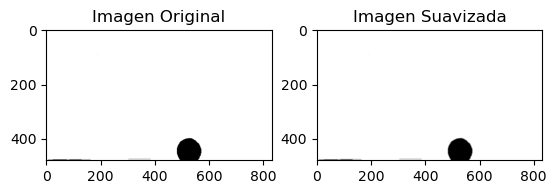

In [161]:

blurred = cv2.GaussianBlur(img_binarizada, (5, 5), 0)
plt.subplot(1, 2, 1)
plt.imshow(img_binarizada, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(blurred, cmap='gray')
plt.title('Imagen Suavizada')
plt.show()


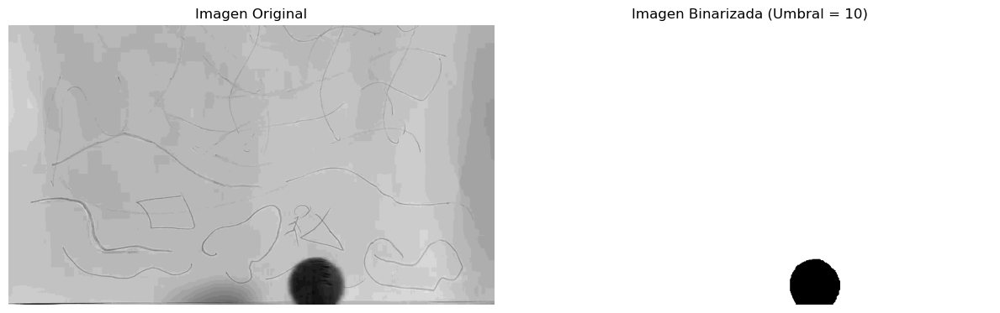

In [162]:

umbral = 10 # Puedes cambiar este valor según tus necesidades

# Binarizar la imagen
_, img_binarizada = cv2.threshold(blurred, umbral, 3, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

plt.tight_layout()
plt.show()


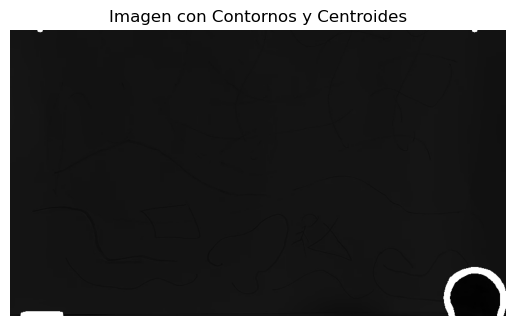

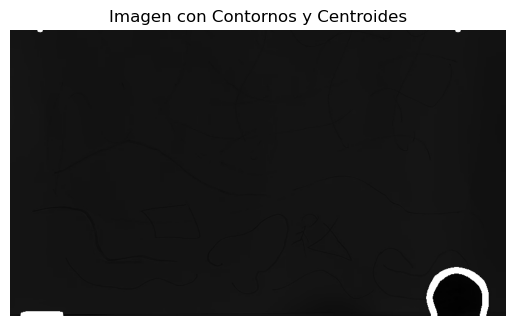

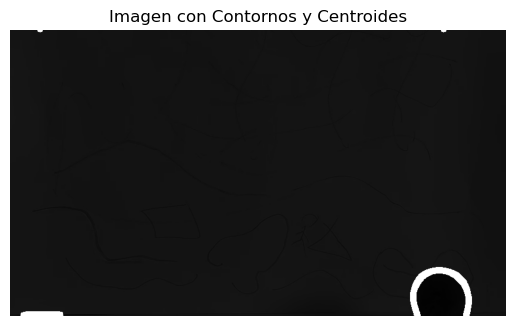

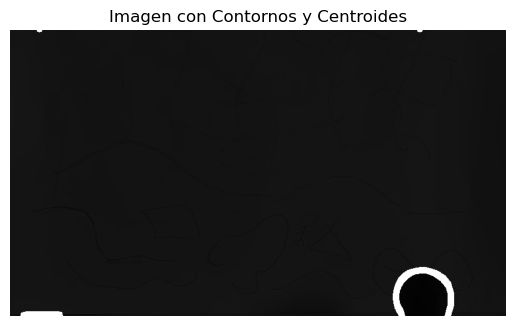

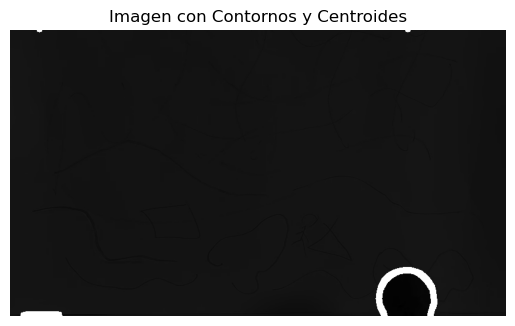

...

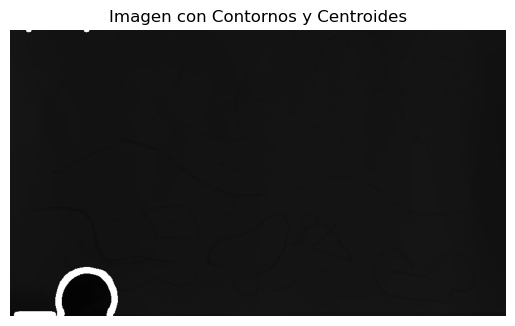

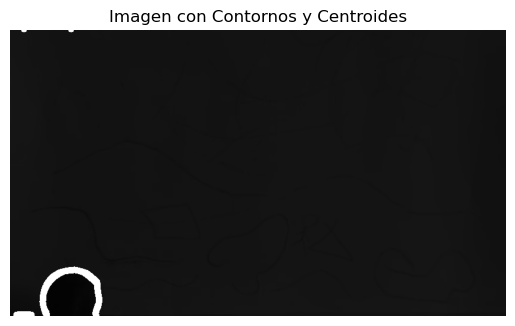

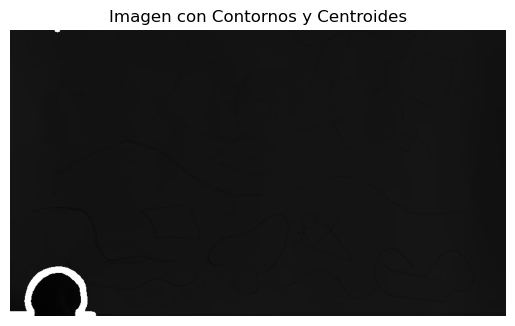

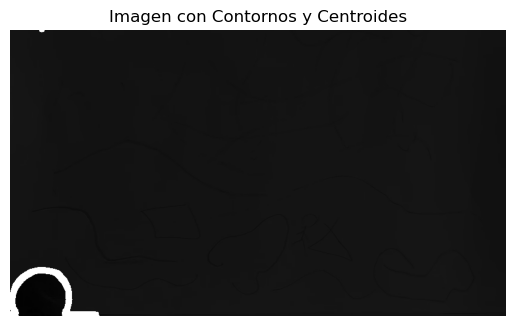

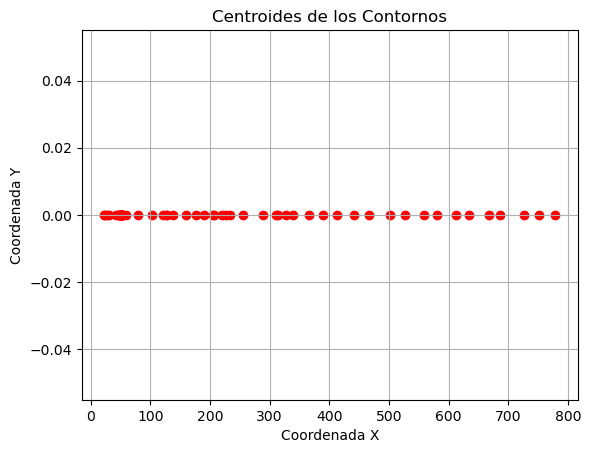

In [163]:
#Lee el video y se hace escala de grises de una vez
cap = cv2.VideoCapture('./videos/recto_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
umbral = 10 
while True:
    # Lee un frame
    ret, frame = cap.read()
    
    # Si no hay más frames, rompe el bucle
    if not ret:
        break
    
    # Convierte el frame a RGB (OpenCV usa BGR por defecto)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


    # Crear copias de la imagen para aislar cada canal
    imageOutB = frame.copy()

    # Aislar el canal B
    imageOutB[:, :, 0] = 0  # R
    imageOutB[:, :, 1] = 0  # G

    frame = cv2.cvtColor(imageOutB, cv2.COLOR_RGB2GRAY)

    # Filtro de Suavizado (Blur)
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)

    # Puedes cambiar este valor según tus necesidades
    umbral = 10 

    # Binarizar la imagen
    _, img_binarizada = cv2.threshold(blurred, umbral, 255, cv2.THRESH_BINARY) 
    
    # Muestra el frame con plt.imshow
    #plt.imshow(img_binarizada, cmap='gray')
    

    #imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(img_binarizada, (9, 9), 0)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(blurred, 70, 150)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m10"] / momentos["m00"])
            centroide_y = int(momentos["m00"] / momentos["m10"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (255, 0, 0), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()

    # Pausa por un corto período de tiempo antes de mostrar el próximo frame
    plt.pause(0.03)  
    cont += 1

    #Se mostrarán 500 frames
    if cont >= 28:
        break
# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

cap.release()

# Cierra todas las ventanas de plt
plt.close('all')

## Recto Fondo con Ruido sin binarización

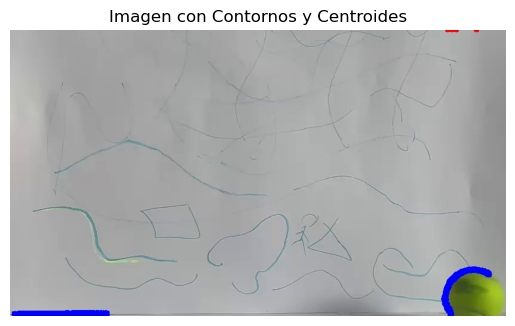

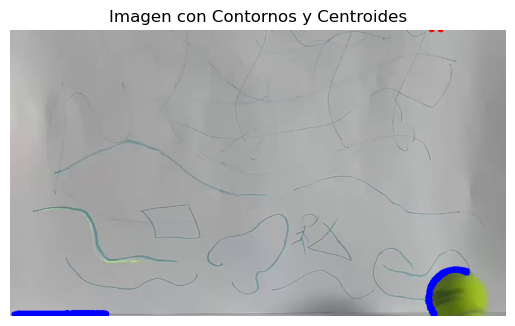

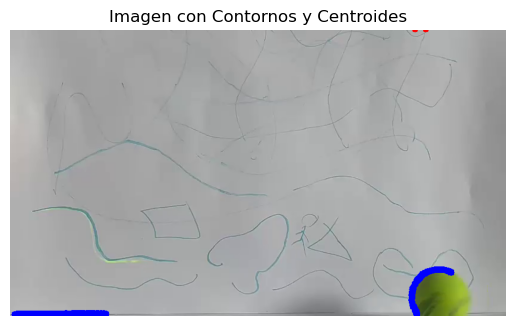

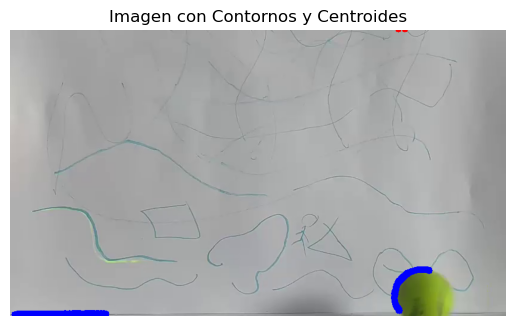

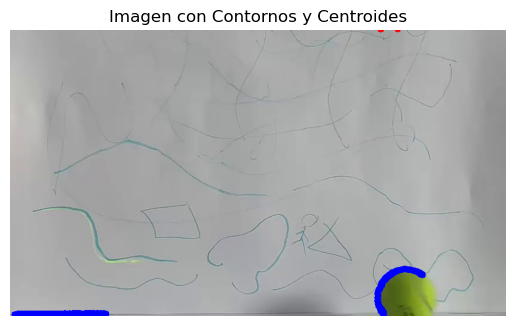

...

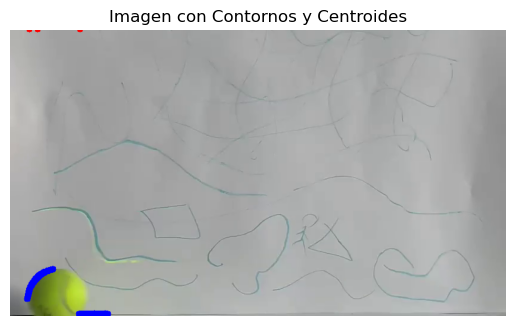

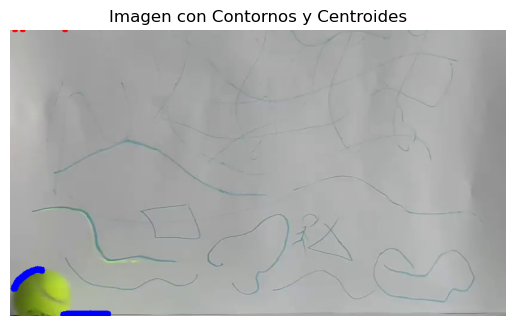

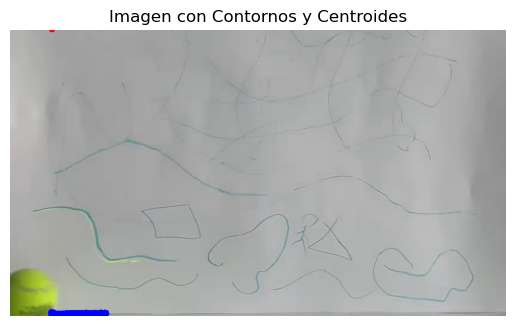

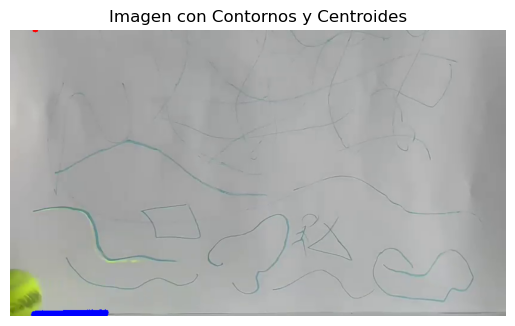

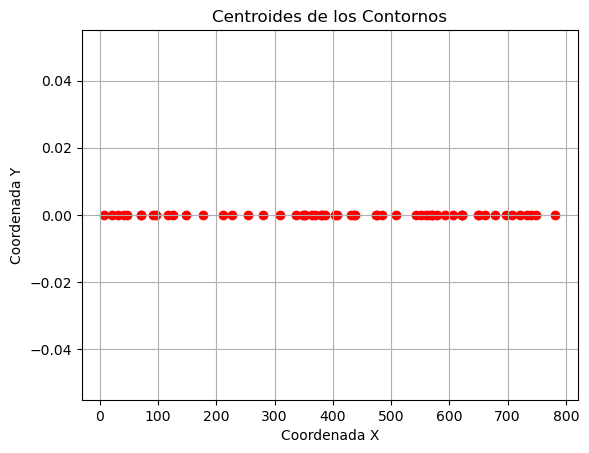

In [181]:
recto_fondoruido = cv2.VideoCapture('./videos/recto_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
while True:
    ret, frame = recto_fondoruido.read()
    
    if not ret:
        break
    
    imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(imagen_gris, (17, 17), 0)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(blurred, 40, 80)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m10"] / momentos["m00"])
            centroide_y = int(momentos["m00"] / momentos["m10"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (0, 0, 255), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()
    
    plt.pause(0.03)  
    cont += 1
    if cont >= 30:
        break

# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

recto_fondoruido.release()

plt.close('all')

## DILATACIÓN (NO SE ADAPTA AL PROYECTO)

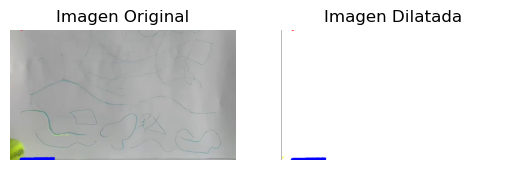

In [186]:
# Crear un kernel (elemento estructurante) para la dilatación
kernel = np.array([[0, 0, 0],
                   [0, 0, 0],
                   [0, 0, 0]], dtype=np.uint8)

# Aplicar dilatación a la imagen binaria
_, img_binarizadaDilatada = cv2.threshold(imagen_rgb, umbral, 255, cv2.THRESH_BINARY) 
imagen_dilatada = cv2.dilate(img_binarizadaDilatada, kernel, iterations=1)

# Mostrar la imagen original y la imagen dilatada
plt.subplot(121)
plt.imshow(imagen_rgb, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(122)
plt.imshow(imagen_dilatada, cmap='gray')
plt.title('Imagen Dilatada')
plt.axis('off')

plt.show()

## Rebote Fondo con Ruido aplicando binarización

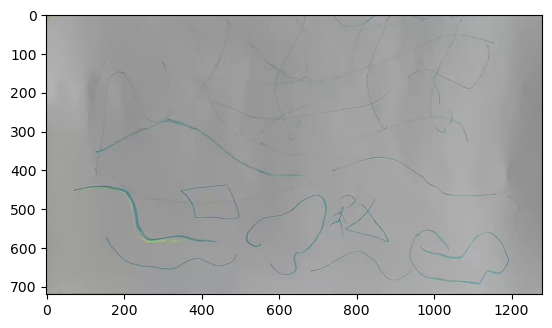

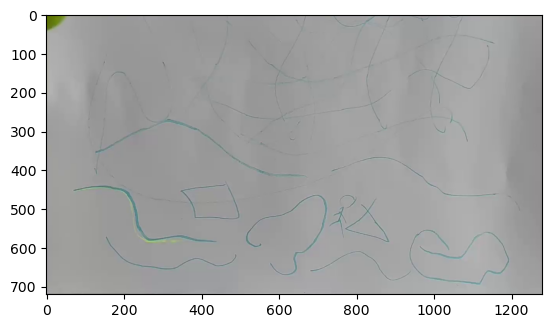

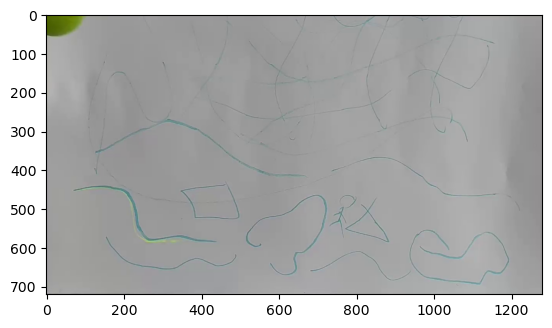

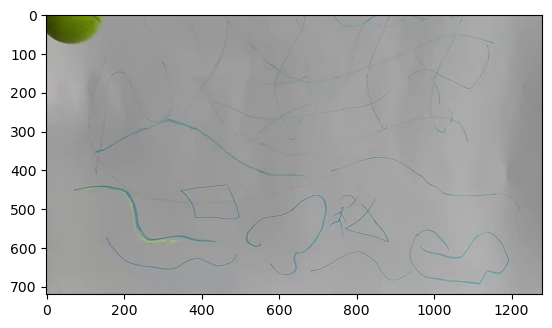

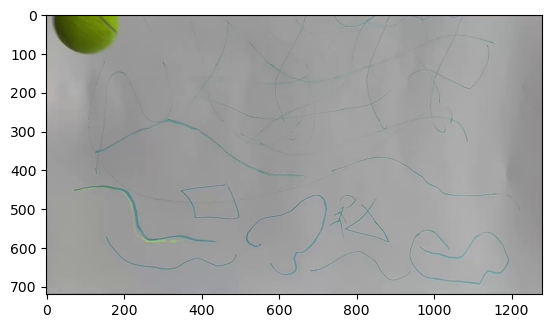

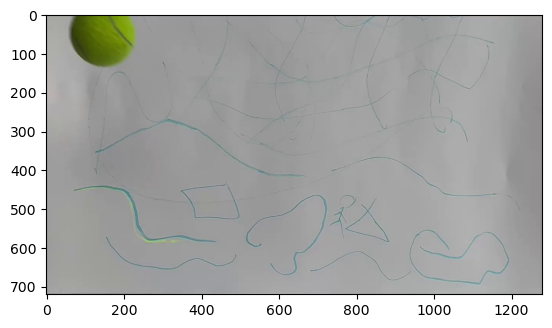

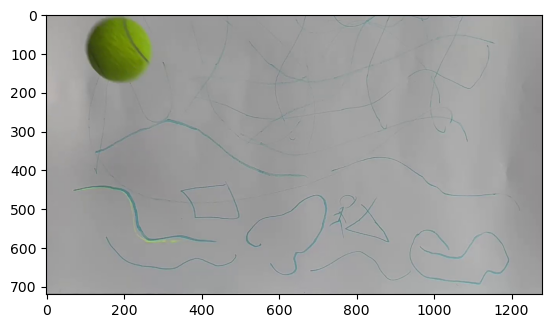

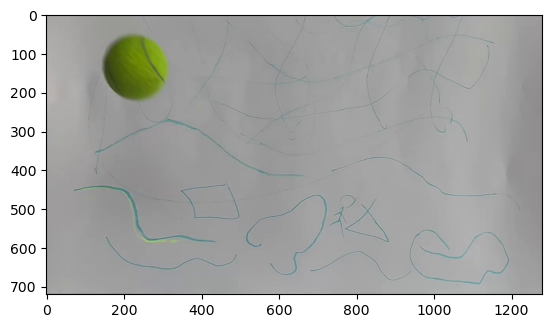

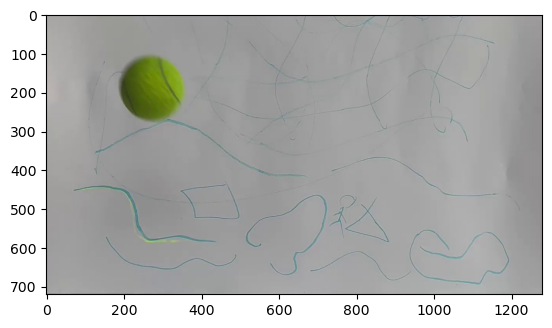

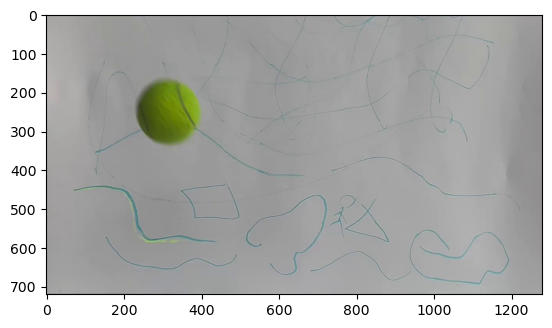

In [166]:
rebote_fondoruido = cv2.VideoCapture('./videos/rebote_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

cont = 0
while True:
    ret, frame = rebote_fondoruido.read()
    
    if not ret:
        break
    
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    
    
    plt.imshow(frame)
    plt.pause(0.03)  
    cont += 1
    if cont >= 10:
        break

rebote_fondoruido.release()

plt.close('all')

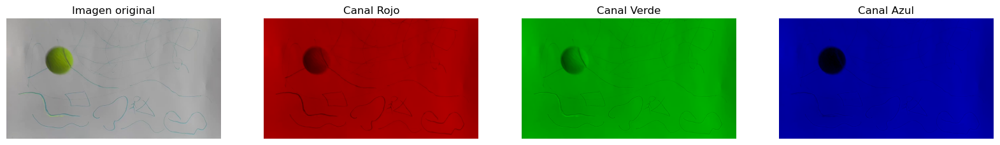

In [167]:
# Leer la imagen y convertirla a RGB

# Crear copias de la imagen para aislar cada canal
imageOutR = frame.copy()
imageOutG = frame.copy()
imageOutB = frame.copy()

# Aislar el canal R
imageOutR[:, :, 1] = 0  # Green
imageOutR[:, :, 2] = 0  # Blue :(dos puntos es todas :(filas), :(columnas), R || G || B (QUITAR CANAL))

# Aislar el canal G
imageOutG[:, :, 0] = 0  # R
imageOutG[:, :, 2] = 0  # B

# Aislar el canal B
imageOutB[:, :, 0] = 0  # R
imageOutB[:, :, 1] = 0  # G

# Visualizar las imágenes
fig, ax = plt.subplots(1, 4, figsize=(20, 5))

#Aplica en la salida el aislamiendo del canal dependiendo la posición del arreglo, es decir con axis se aplican las dimensiones del arreglo
ax[0].imshow(frame)
ax[0].set_title("Imagen original")
ax[0].axis('off')

ax[1].imshow(imageOutR)
ax[1].set_title("Canal Rojo")
ax[1].axis('off')

ax[2].imshow(imageOutG)
ax[2].set_title("Canal Verde")
ax[2].axis('off')

ax[3].imshow(imageOutB)
ax[3].set_title("Canal Azul")
ax[3].axis('off')

plt.show()

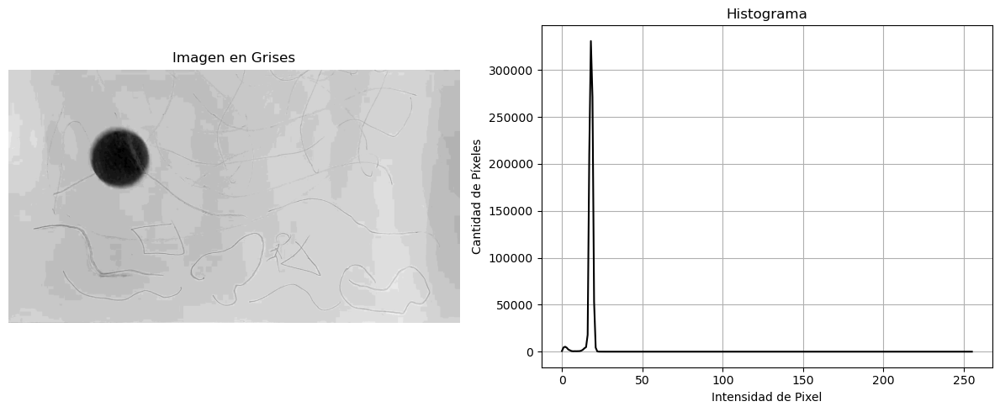

In [168]:
img = cv2.cvtColor(imageOutB, cv2.COLOR_RGB2GRAY)  

# Calcular el histograma
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

# Visualizar la imagen y su histograma
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen en Grises")
ax[0].axis('off')

# Mostrar el histograma
ax[1].plot(hist, color='black')
ax[1].set_title("Histograma")
ax[1].set_xlabel("Intensidad de Pixel")
ax[1].set_ylabel("Cantidad de Píxeles")
ax[1].grid(True)

#Su propósito principal es ajustar automáticamente los márgenes y espacios entre subtramas o elementos en un gráfico.
plt.tight_layout()

plt.show()

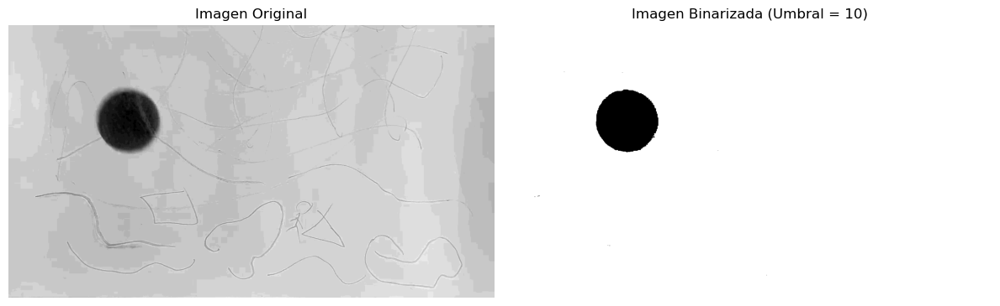

In [169]:
# Puedes cambiar este valor según tus necesidades
umbral = 10 

# Binarizar la imagen
_, img_binarizada = cv2.threshold(img, umbral, 255, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

#Su propósito principal es ajustar automáticamente los márgenes y espacios entre subtramas o elementos en un gráfico.
plt.tight_layout()

plt.show()

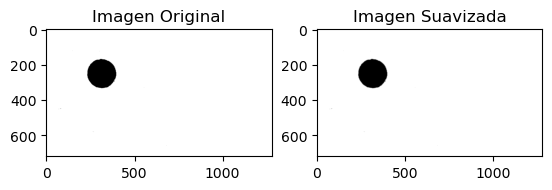

In [170]:
blurred = cv2.GaussianBlur(img_binarizada, (5, 5), 0)
plt.subplot(1, 2, 1)
plt.imshow(img_binarizada, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(blurred, cmap='gray')
plt.title('Imagen Suavizada')
plt.show()

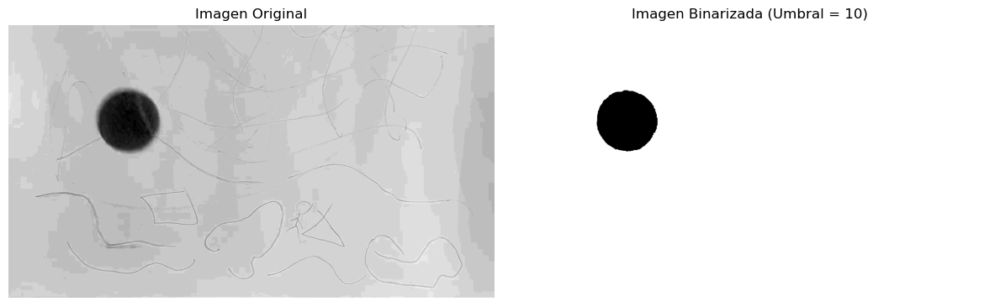

In [171]:
umbral = 10 # Puedes cambiar este valor según tus necesidades

# Binarizar la imagen
_, img_binarizada = cv2.threshold(blurred, umbral, 3, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

plt.tight_layout()
plt.show()

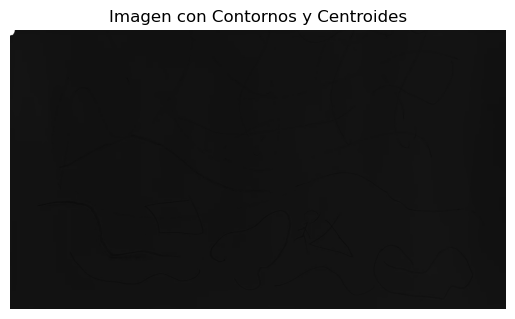

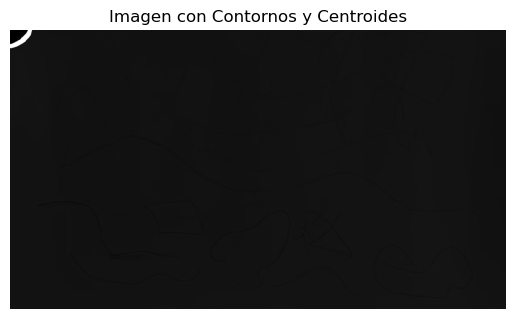

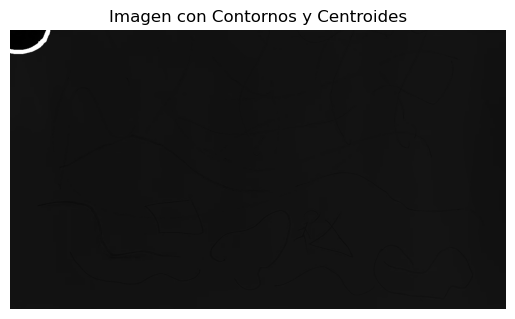

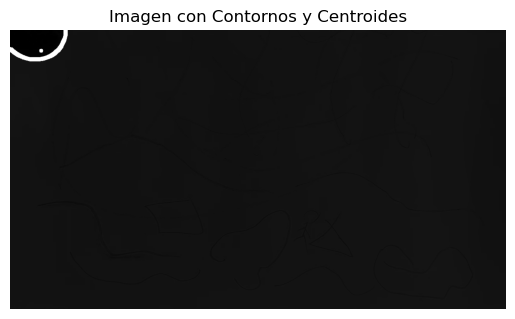

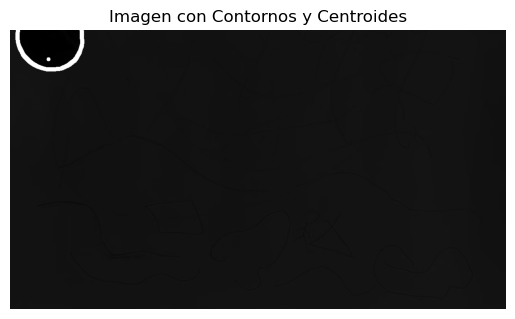

...

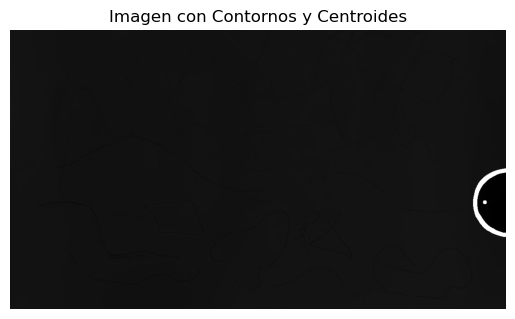

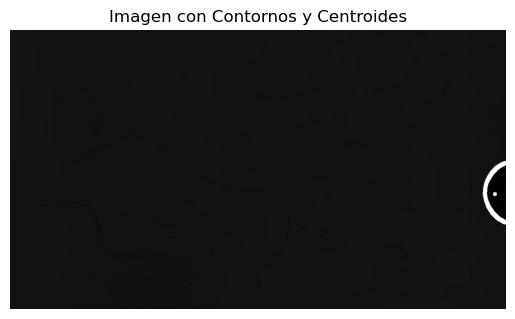

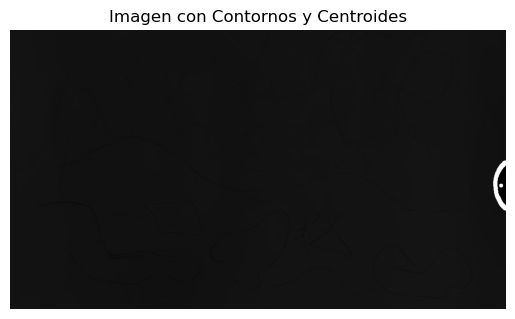

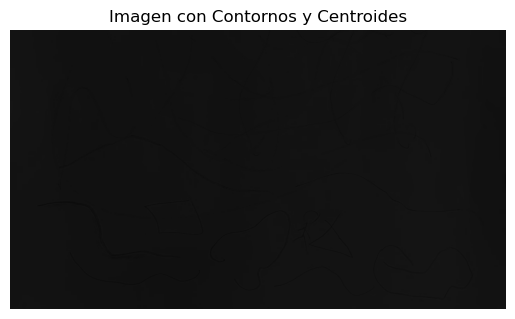

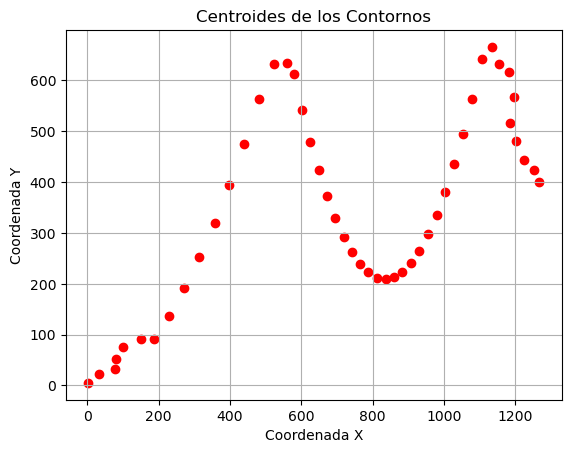

In [172]:
#Lee el video y se hace escala de grises de una vez
cap = cv2.VideoCapture('./videos/rebote_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
umbral = 10 
while True:
    # Lee un frame
    ret, frame = cap.read()
    
    # Si no hay más frames, rompe el bucle
    if not ret:
        break
    
    # Convierte el frame a RGB (OpenCV usa BGR por defecto)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


    # Crear copias de la imagen para aislar cada canal
    imageOutB = frame.copy()

    # Aislar el canal B
    imageOutB[:, :, 0] = 0  # R
    imageOutB[:, :, 1] = 0  # G

    frame = cv2.cvtColor(imageOutB, cv2.COLOR_RGB2GRAY)

    # Filtro de Suavizado (Blur)
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)

    # Puedes cambiar este valor según tus necesidades
    umbral = 10 

    # Binarizar la imagen
    _, img_binarizada = cv2.threshold(blurred, umbral, 255, cv2.THRESH_BINARY) 
    
    # Muestra el frame con plt.imshow
    #plt.imshow(img_binarizada, cmap='gray')
    

    #imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(img_binarizada, (9, 9), 0)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(blurred, 70, 150)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m10"] / momentos["m00"])
            centroide_y = int(momentos["m01"] / momentos["m00"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (255, 0, 0), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()

    # Pausa por un corto período de tiempo antes de mostrar el próximo frame
    plt.pause(0.03)  
    cont += 1

    #Se mostrarán 500 frames
    if cont >= 49:
        break
# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

cap.release()

# Cierra todas las ventanas de plt
plt.close('all')

## Rebote Fondo con Ruido sin binarización

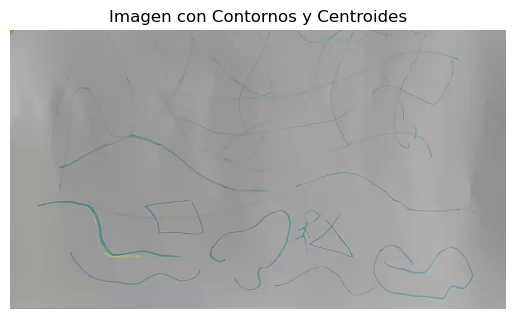

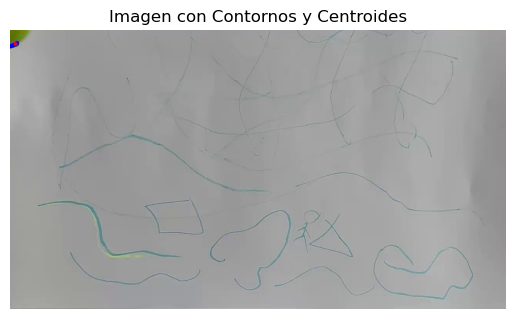

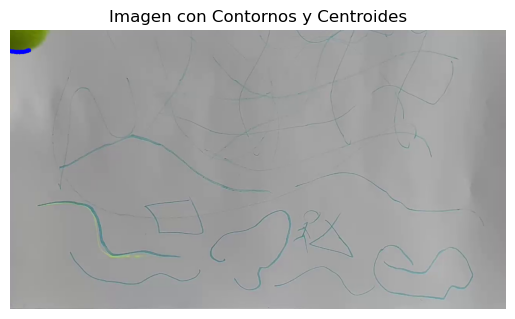

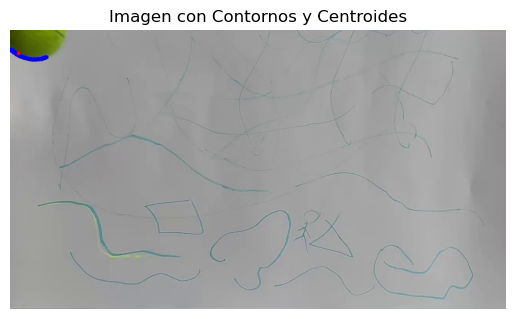

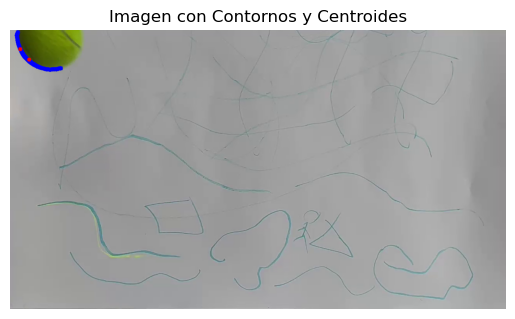

...

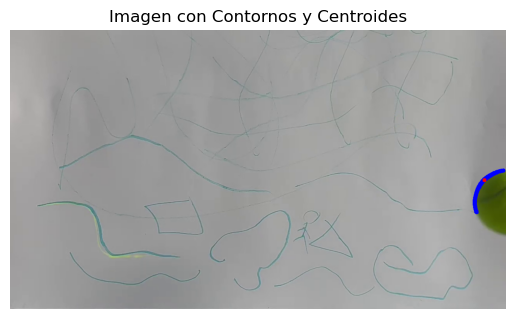

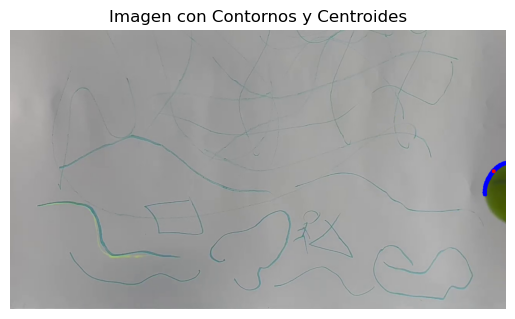

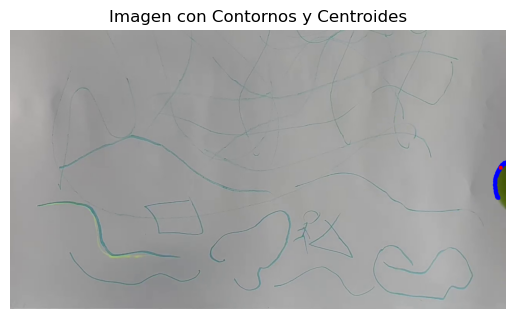

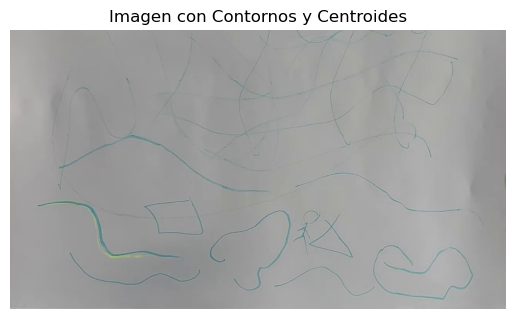

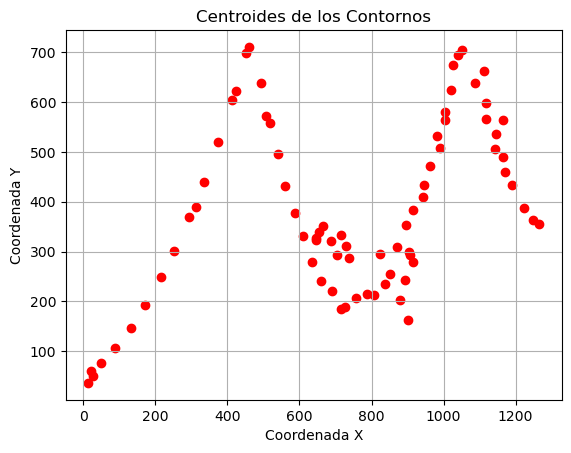

In [173]:
rebote_fondoruido = cv2.VideoCapture('./videos/rebote_fondoruido.mp4', cv2.IMREAD_GRAYSCALE)

centroides_x = []
centroides_y = []

cont = 0
while True:
    ret, frame = rebote_fondoruido.read()
    
    if not ret:
        break
    
    imagen_gris = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    blurred = cv2.GaussianBlur(imagen_gris, (17, 17), 0)

    # Encontrar los bordes usando el detector de bordes Canny
    bordes = cv2.Canny(blurred, 40, 80)

    # Encontrar contornos en la imagen de bordes
    contornos, jerarquia = cv2.findContours(bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    imagen_contornos = frame.copy()

    cv2.drawContours(imagen_contornos, contornos, -1, (255, 0, 0), 10)

    # Calcular y dibujar los centroides de los contornos
    for contorno in contornos:
        momentos = cv2.moments(contorno)
        if momentos["m00"] != 0:
            centroide_x = int(momentos["m10"] / momentos["m00"])
            centroide_y = int(momentos["m01"] / momentos["m00"])
            cv2.circle(imagen_contornos, (centroide_x, centroide_y), 5, (0, 0, 255), -1)
            centroides_x.append(centroide_x)
            centroides_y.append(centroide_y)

    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB)

    # Mostrar la imagen con los contornos y los centroides utilizando Matplotlib
    plt.imshow(imagen_rgb)
    plt.title('Imagen con Contornos y Centroides')
    plt.axis('off')
    plt.show()
    
    plt.pause(0.03)  
    cont += 1
    if cont >= 49:
        break

# Crear una gráfica para mostrar los centroides
plt.scatter(centroides_x, centroides_y, c='r', marker='o', label='Centroides')
plt.title('Centroides de los Contornos')
plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')

# Mostrar la gráfica
plt.grid(True)
plt.show()

recto_fondoruido.release()

plt.close('all')